<a href="https://colab.research.google.com/github/vee-16/notes-to-text/blob/doctr/doctr_test.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
! pip install python-doctr
! pip install mplcursors
! pip install matplotlib



In [ ]:
from doctr.models import ocr_predictor

model = ocr_predictor(det_arch='db_resnet50', reco_arch='crnn_vgg16_bn', pretrained=True)

In [ ]:


from doctr.io import DocumentFile

image1 = DocumentFile.from_images("/content/drive/MyDrive/AI In Mental Health Diagnoses Project/sample3_notes_sc1.jpg")
image2 = DocumentFile.from_images("/content/drive/MyDrive/AI In Mental Health Diagnoses Project/sample3_notes_sc2.jpg")
sample1 = DocumentFile.from_pdf("/content/drive/MyDrive/AI In Mental Health Diagnoses Project/Sample 1.docx.pdf")
result = model(image1)


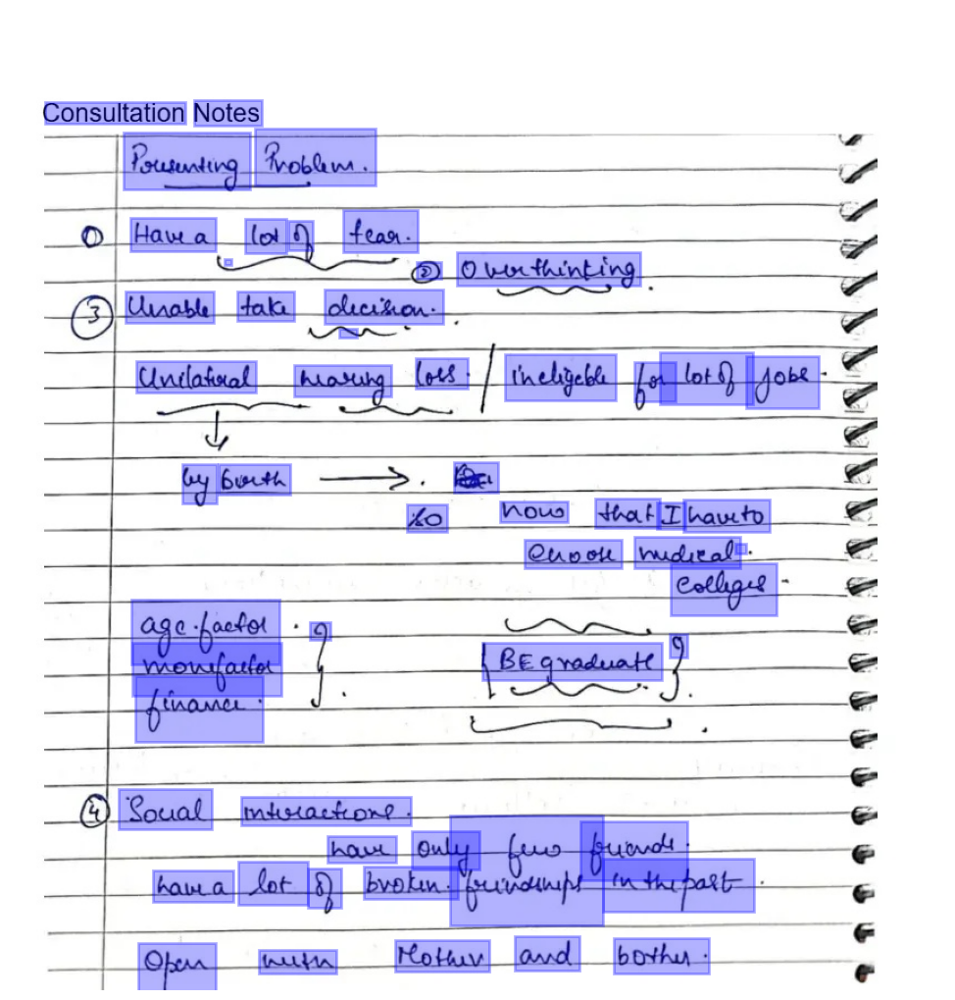

In [ ]:
result.show()

In [ ]:

def strucutrize(doc):
  for page_idx, page in enumerate(doc.pages):
      print(f"\n--- Page {page_idx} ---")
      for block in page.blocks:
          for line in block.lines:
              line_text = " ".join([w.value for w in line.words])
              line_conf = sum([w.confidence for w in line.words]) / max(1, len(line.words))
              print(f"LINE: {line_text}  (avg conf: {line_conf:.3f})")

              for w in line.words:
                  # w.geometry is ((x0,y0),(x1,y1)) normalized to [0,1]
                  print(f"  WORD: {w.value:20s} conf={w.confidence:.3f} box={w.geometry}")
strucutrize(result)



--- Page 0 ---
LINE: Consultation Notes  (avg conf: 0.940)
  WORD: Consultation         conf=0.881 box=((np.float64(0.03670074246453903), np.float64(0.0947265625)), (np.float64(0.18704288563829785), np.float64(0.1162109375)))
  WORD: Notes                conf=0.999 box=((np.float64(0.19624750664893614), np.float64(0.0927734375)), (np.float64(0.2688617390661938), np.float64(0.1181640625)))
LINE: Pousunting Rroblm.  (avg conf: 0.368)
  WORD: Pousunting           conf=0.308 box=((np.float64(0.12056506722813237), np.float64(0.125)), (np.float64(0.25556617538416077), np.float64(0.18359375)))
  WORD: Rroblm.              conf=0.429 box=((np.float64(0.26170258939125296), np.float64(0.12109375)), (np.float64(0.3905672835401891), np.float64(0.1796875)))
LINE: Hawa lot 0 feag.  (avg conf: 0.694)
  WORD: Hawa                 conf=0.994 box=((np.float64(0.12772421690307328), np.float64(0.212890625)), (np.float64(0.21977042700945626), np.float64(0.24609375)))
  WORD: lot                  conf=0.46

In [ ]:
result.render()

'Consultation Notes\nPousunting Rroblm.\nHawa lot 0 feag.\n-\nD) Obrthinting\nUusable taki olicikon.\n/\nUndatsal\nhuaslihg loes\ntheligeba Lon lotD fobe\nby buth\nKEL\nko\nwous that I hauto\nQunol hudieal -\nCollgee\nage-faclel 9\n9\nmonifalel\nBegroduatt\nfinaner\nSoual masiactorg.\nhau guly\nfutuds\nhaua lot 8 bvokin. Hrhtoye mthepart\nOpara\nhutn\nKotav and\nbothup.'

In [ ]:
json_output = result.export()
json_output

{'pages': [{'page_idx': 0,
   'dimensions': (886, 846),
   'orientation': {'value': None, 'confidence': None},
   'language': {'value': None, 'confidence': None},
   'blocks': [{'geometry': ((np.float64(0.03670074246453903),
       np.float64(0.0927734375)),
      (np.float64(0.8630711620862884), np.float64(1.0))),
     'objectness_score': 0.4110490653131689,
     'lines': [{'geometry': ((np.float64(0.03670074246453903),
         np.float64(0.0927734375)),
        (np.float64(0.2688617390661938), np.float64(0.1181640625))),
       'objectness_score': 0.5736805498600006,
       'words': [{'value': 'Consultation',
         'confidence': 0.8809325695037842,
         'geometry': ((np.float64(0.03670074246453903),
           np.float64(0.0947265625)),
          (np.float64(0.18704288563829785), np.float64(0.1162109375))),
         'objectness_score': 0.5730336904525757,
         'crop_orientation': {'value': 0, 'confidence': None}},
        {'value': 'Notes',
         'confidence': 0.999335

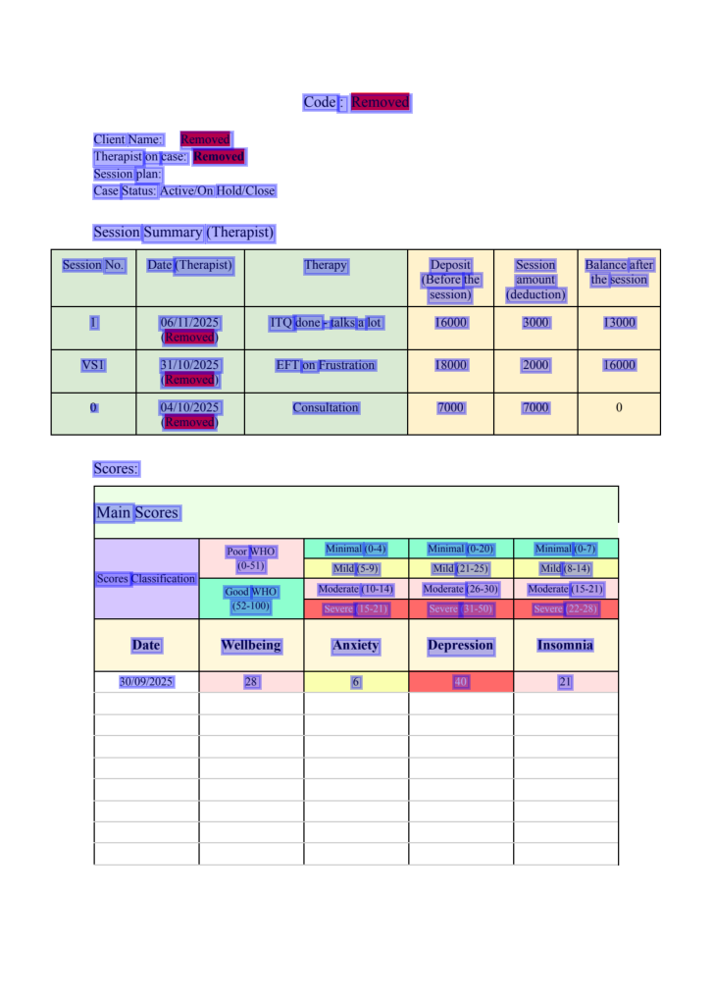

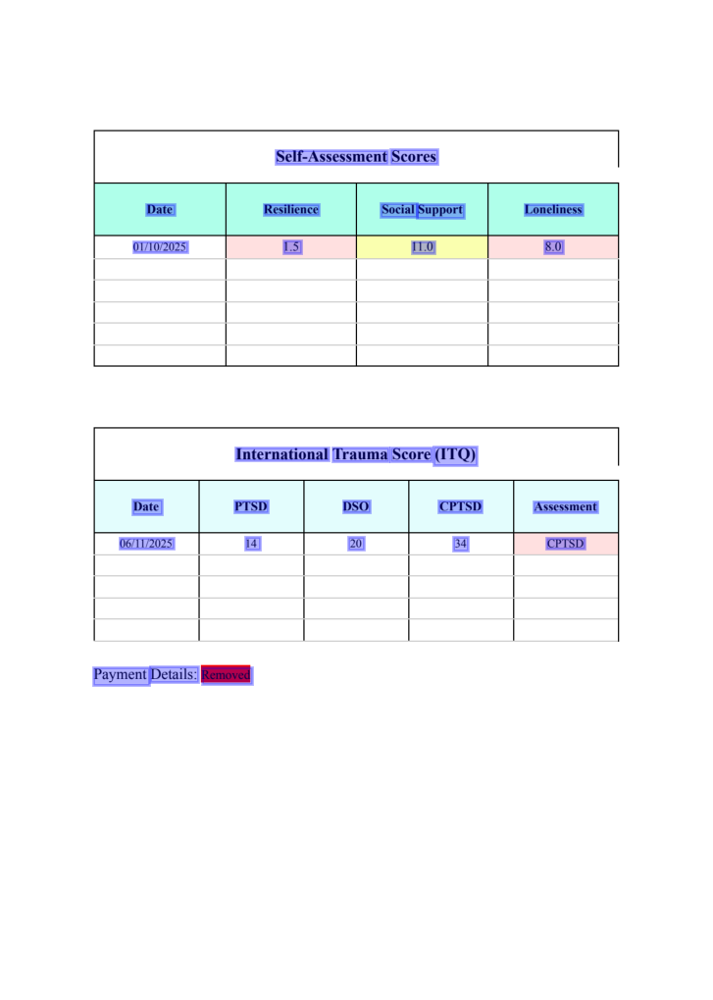

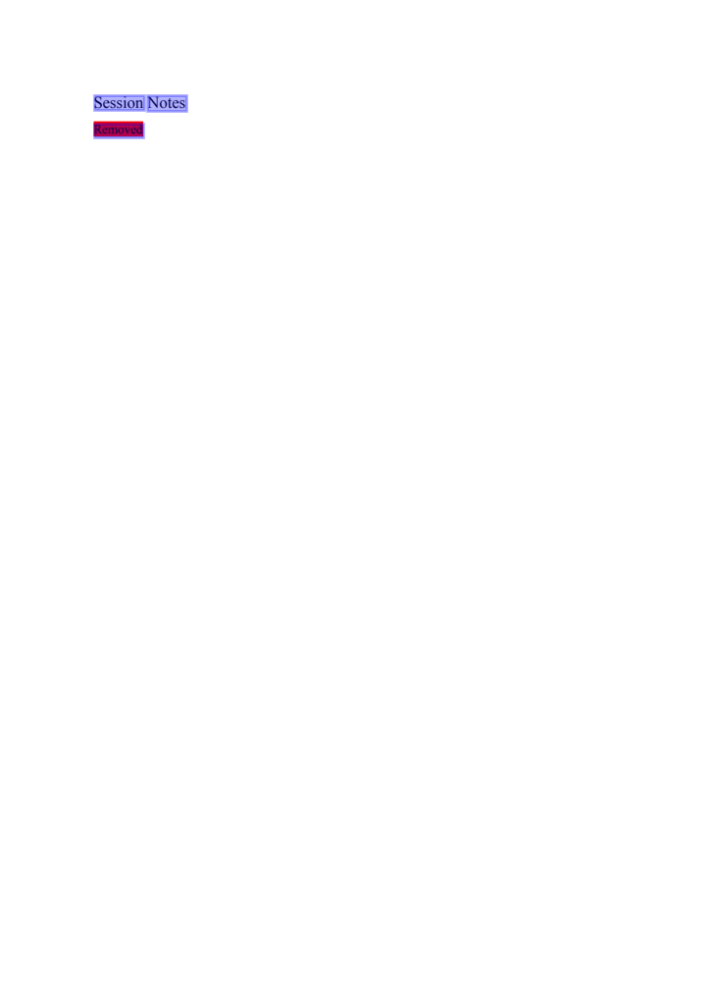

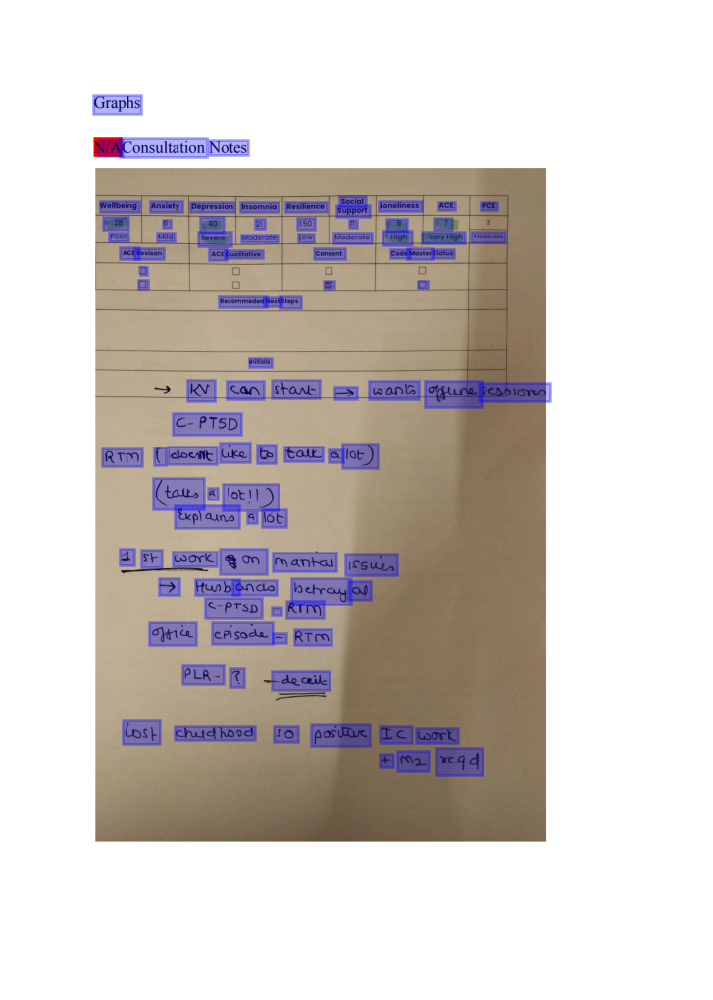

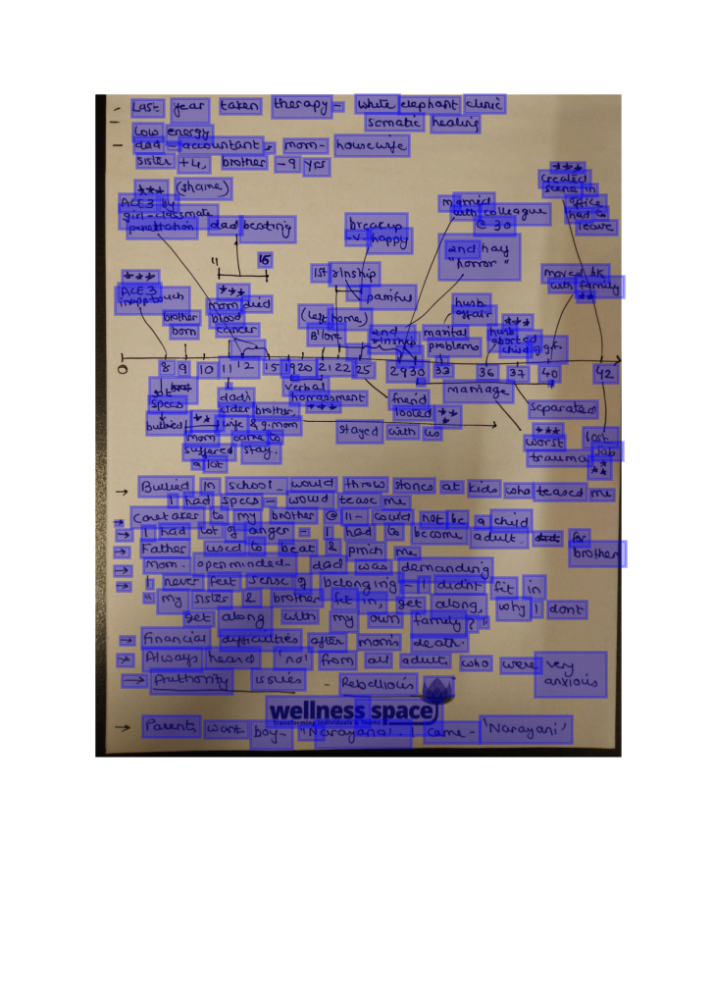

...

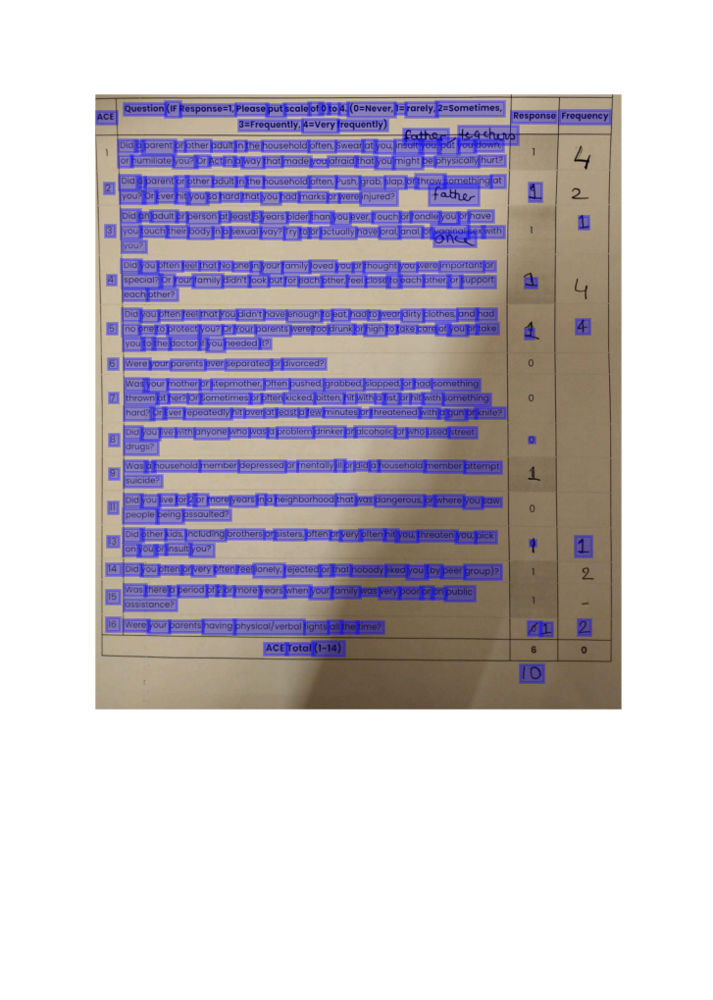

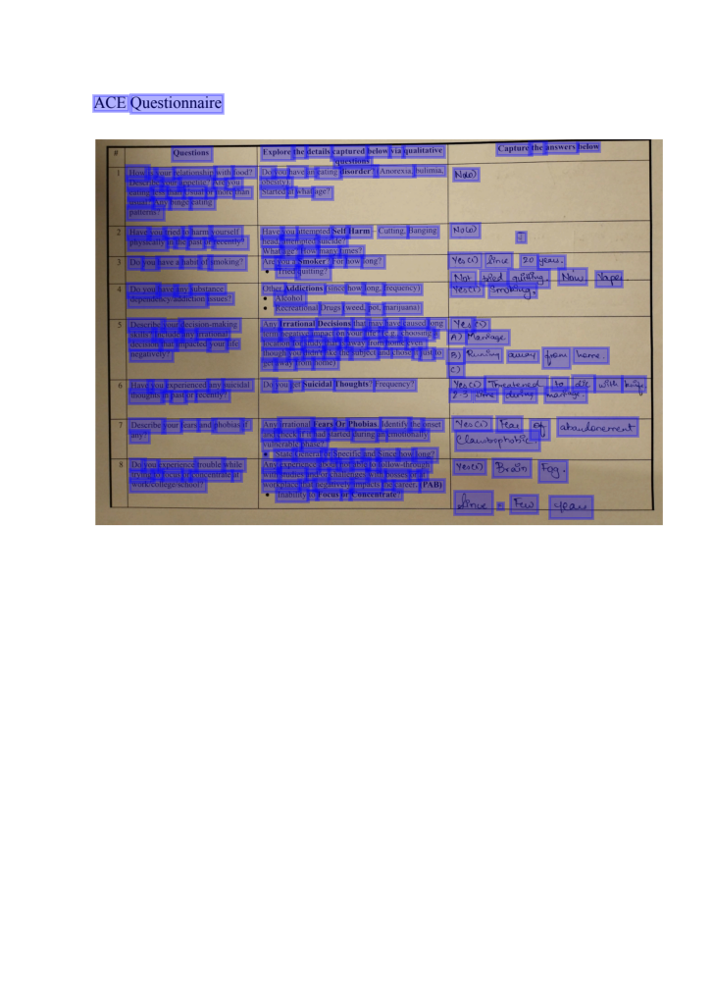

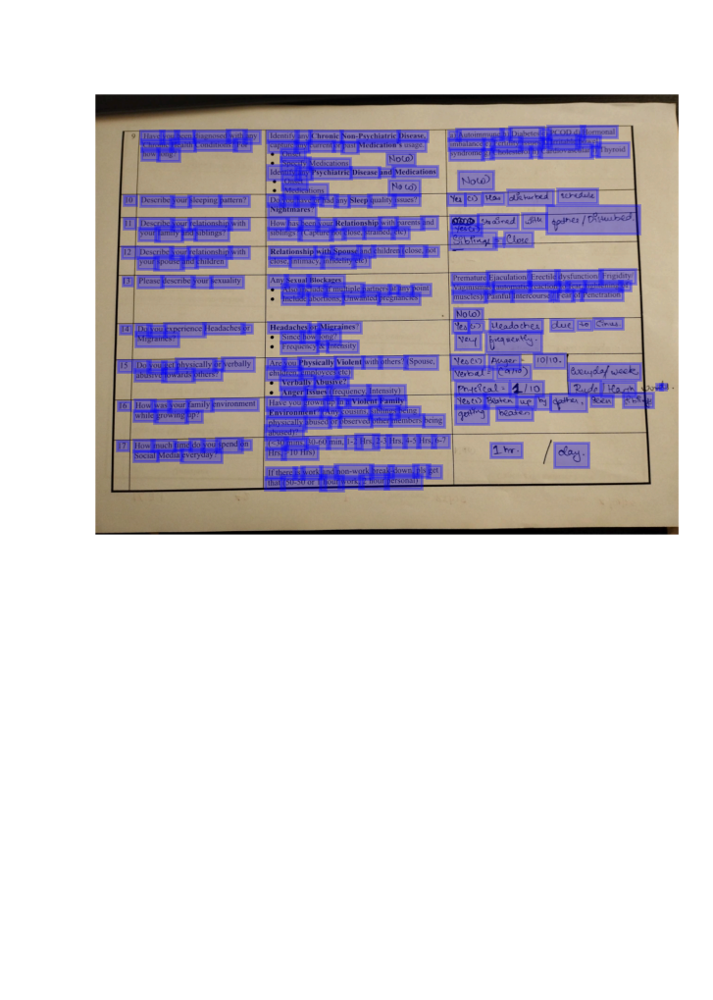

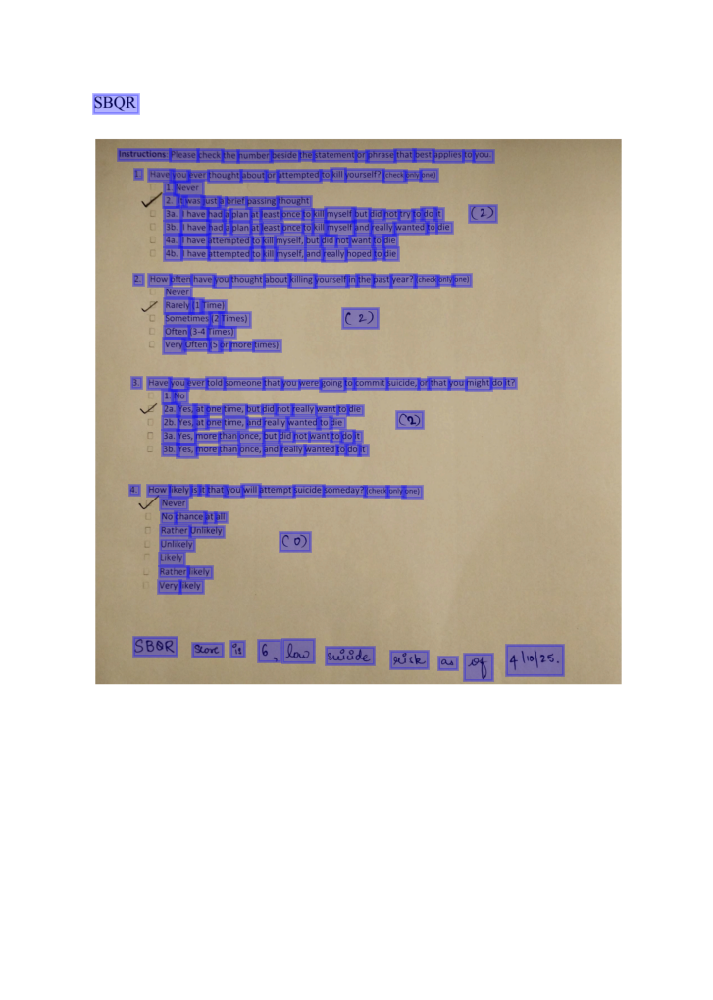

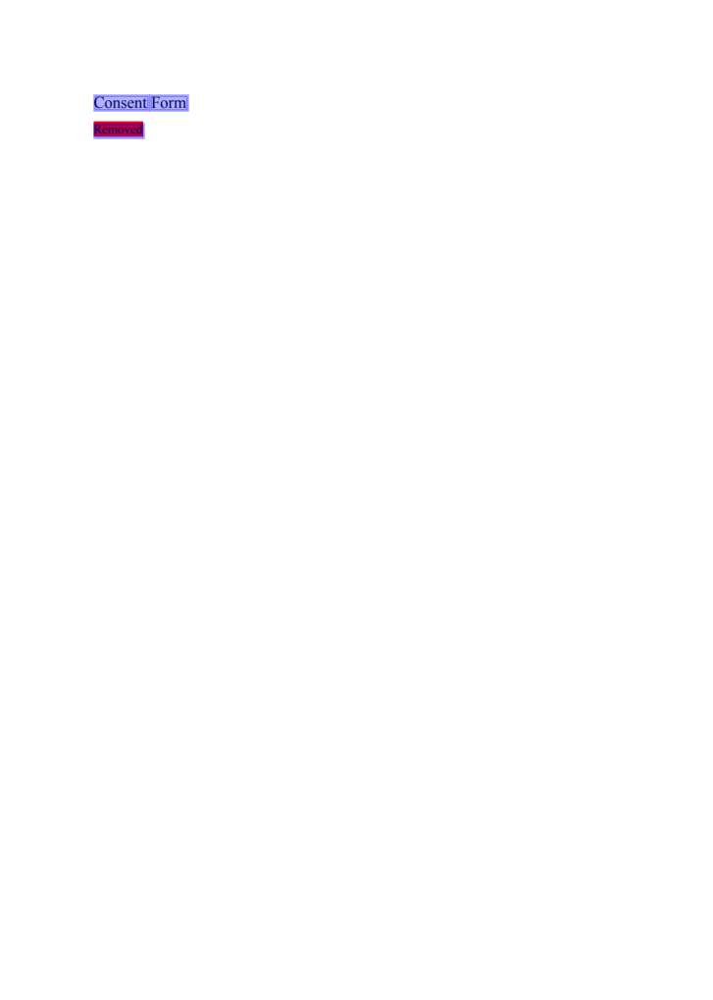

In [ ]:
results=model(sample1)
results.show()


In [ ]:
strucutrize(results)


--- Page 0 ---
LINE: Code : Removed  (avg conf: 0.996)
  WORD: Code                 conf=0.997 box=((np.float64(0.42136050230704697), np.float64(0.0869140625)), (np.float64(0.4724071937919463), np.float64(0.1025390625)))
  WORD: :                    conf=1.000 box=((np.float64(0.4710275534815436), np.float64(0.0888671875)), (np.float64(0.48620359689597314), np.float64(0.1044921875)))
  WORD: Removed              conf=0.990 box=((np.float64(0.4903425178271812), np.float64(0.0869140625)), (np.float64(0.5772598573825504), np.float64(0.1044921875)))
LINE: Client Name: Removed  (avg conf: 0.987)
  WORD: Client               conf=0.970 box=((np.float64(0.12059891463926176), np.float64(0.126953125)), (np.float64(0.16750668519295303), np.float64(0.138671875)))
  WORD: Name:                conf=0.991 box=((np.float64(0.1702659658137584), np.float64(0.126953125)), (np.float64(0.22131265729865773), np.float64(0.138671875)))
  WORD: Removed              conf=0.998 box=((np.float64(0.2447665425755